<a href="https://colab.research.google.com/github/MasoudMoeini/Google-Street-View-Images-Blur-Detection/blob/main/SBDN_Shi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras.models import Sequential, Model,load_model
from keras.optimizers import gradient_descent_v2 
from google.colab.patches import cv2_imshow
from keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D,MaxPool2D
from keras.preprocessing import image
from keras.initializers import glorot_uniform
from keras import regularizers

In [ ]:
!unzip -qq train.zip

In [ ]:
from numpy import *
images_folder= "train/images/*.jpg"
labels_folder = "train/labels/"
def data_preprocessing(images_folder,labels_folder):
  total_img = []
  class_label=[]
  label = []
  files = glob.glob (images_folder)
  for myFile in files:
      image_name=os.path.split(myFile)[1]
      class_label.append(float(image_name[0]))
      image = array(Image.open(myFile))
      label_image = array(Image.open(labels_folder+image_name))
      label.append (label_image)
      total_img.append (image)
  total_img = np.array(total_img)
  label = np.array(label)
  label= np.reshape(label,[label.shape[0],label.shape[1],label.shape[2]])
  total_img= np.reshape(total_img,[total_img.shape[0],total_img.shape[1],total_img.shape[2],total_img.shape[3]])
  class_label=np.array(class_label) 
  return label,total_img,class_label

In [ ]:
total_labels,total_images,class_labels=data_preprocessing(images_folder,labels_folder)

In [ ]:
total_images.shape

(984, 224, 224, 3)

In [ ]:
def identity_block(X, f, filters, stage, block):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    F1, F2, F3 = filters

    X_shortcut = X
   
    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2a', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X = Add()([X, X_shortcut])# SKIP Connection
    X = Activation('relu')(X)

    return X

In [ ]:
def convolutional_block(X, f, filters, stage, block, s=2):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    F1, F2, F3 = filters

    X_shortcut = X

    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '2a', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X_shortcut = Conv2D(filters=F3, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '1', kernel_initializer=glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis=3, name=bn_name_base + '1')(X_shortcut)

    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)

    return X

In [ ]:
def decoder_network(X):
    #x_input = layers.Input(shape=(147))
    #x = keras.layers.Reshape([7,7,3])(dX)
    x = layers.Conv2DTranspose(2048, (3, 3), strides=2, activation="relu", padding="same")(X)
    x = layers.Conv2DTranspose(512, (3, 3), strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(128, (3, 3), strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(3, (3, 3), strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(3, (3, 3), strides=1, activation="relu",kernel_regularizer=regularizers.L2(l2=0.0005),
      bias_regularizer=regularizers.L2(l2=0.005), padding="same")(x)
    x = layers.Conv2DTranspose(3, (3, 3), strides=1, activation="sigmoid",kernel_regularizer=regularizers.L2(l2=0.0005),
      bias_regularizer=regularizers.L2(l2=0.005), padding="same")(x)
    output = layers.Conv2DTranspose(1, (3, 3), strides=1, activation="sigmoid", padding="same",kernel_regularizer=regularizers.L2(l2=0.005),
      bias_regularizer=regularizers.L2(l2=0.0005), name="ident")(x)
    #model = Model(inputs=X, outputs=output, name='decoder_network')
    return output

In [ ]:
def ResNet50():
    #X_input = keras.Input(shape=(224, 224, 3))
    X_input = layers.Input(shape=(224, 224, 3))
    #X = data_augmentation(X_input)
    #X = layers.Rescaling(1./255)(X)
    X = ZeroPadding2D((3, 3))(X_input)
    X = Conv2D(64, (7, 7), strides=(2, 2), name='conv1', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name='bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    X = convolutional_block(X, f=3, filters=[64, 64, 256], stage=2, block='a', s=1)
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='b')
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='c')


    X = convolutional_block(X, f=3, filters=[128, 128, 512], stage=3, block='a', s=2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')

    X = convolutional_block(X, f=3, filters=[256, 256, 1024], stage=4, block='a', s=2)
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='c')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='d')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='e')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='f')
    X = X = convolutional_block(X, f=3, filters=[512, 512, 2048], stage=5, block='a', s=2)
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='c')
    #7*7*2048
    output1=decoder_network(X)
    #X = AveragePooling2D(pool_size=(2, 2), padding='same')(X)
    #X = Flatten()(X)
    #X = Dense(256, activation='relu', name='fc1',kernel_initializer=glorot_uniform(seed=0))(X)
    #X = Dense(128, activation='relu', name='fc2',kernel_initializer=glorot_uniform(seed=0))(X)
    #main = Dense( 1,activation='sigmoid', name='main',kernel_initializer=glorot_uniform(seed=0))(X)
    model = Model(inputs=X_input, outputs=output1, name='ResNet50')
    return model

In [ ]:
model= ResNet50()

In [ ]:
loss1=tf.keras.losses.MeanSquaredError()
loss2=tf.keras.losses.BinaryCrossentropy()
model.compile(keras.optimizers.Adam(learning_rate=1e-3),loss = [loss1],metrics=["accuracy"])

In [ ]:
class_label=class_labels[:500]
x_train = total_images[:500].astype(np.float32)/ 255.0
y_train=total_labels[:500].astype(np.float32)/ 255.0
y_train=(y_train)

In [ ]:
history = model.fit(x_train,y_train, epochs=100,batch_size=25, validation_split=0.0,shuffle=True)
model.save('sbdn-shi-model.h5')

Epoch 1/100
20/20 [==============================] - 28s 547ms/step - loss: 0.2402 - accuracy: 0.6187
Epoch 2/100
20/20 [==============================] - 11s 546ms/step - loss: 0.2335 - accuracy: 0.6309
Epoch 3/100
20/20 [==============================] - 11s 548ms/step - loss: 0.2204 - accuracy: 0.6485
Epoch 4/100
20/20 [==============================] - 11s 551ms/step - loss: 0.2097 - accuracy: 0.6574
Epoch 5/100
20/20 [==============================] - 11s 554ms/step - loss: 0.2018 - accuracy: 0.6761
Epoch 6/100
20/20 [==============================] - 11s 556ms/step - loss: 0.1945 - accuracy: 0.7063
Epoch 7/100
20/20 [==============================] - 11s 559ms/step - loss: 0.1877 - accuracy: 0.7220
Epoch 8/100
20/20 [==============================] - 11s 561ms/step - loss: 0.1861 - accuracy: 0.7229
Epoch 9/100
20/20 [==============================] - 11s 564ms/step - loss: 0.1795 - accuracy: 0.7334
Epoch 10/100
20/20 [==============================] - 11s 568ms/step - loss: 0.177

In [ ]:
history_dict = history.history
print(history_dict.keys())

dict_keys(['loss', 'accuracy'])


In [ ]:
import pandas as pd
hist_df = pd.DataFrame(history.history)
hist_csv_file = 'sbdn-shi-history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

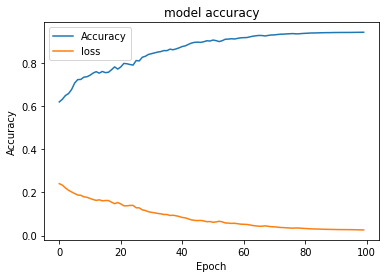

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history["accuracy"])
#plt.plot(history.history['val_accuracy'])
plt.plot(history.history['loss'])
#plt.plot(history.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy","loss"])
plt.show()

In [ ]:
eval_images=total_images[500:]
eval_labels=total_labels[500:]
eval_class_label=class_labels[500:]

In [ ]:
from keras.models import load_model
from PIL import Image
images = eval_images
model = load_model("sbdn-shi-model.h5")
last_conv_layer_name="ident"
predictions=[]
heatmaps=[]
for i in range(images.shape[0]):
  img = images[i]
  img = img.astype(np.float32)/ 255.0
  img = np.expand_dims(img, -1)
  img = np.expand_dims(img, 0)
  pred = model.predict(img)
  predictions.append(pred)

In [ ]:
len(predictions)

484

## Instantiate Optimal Threshould for Evaluation Ground Truths

In [ ]:
ground_truth_total=eval_labels/255.0
ground_truth_total=np.where(ground_truth_total>0.5,1.0,0.0)

In [ ]:
def get_iou_score(true_label, y_pred_label):
  iou_scores=[]
  for i in range(0,len(true_label)):
    #true_label = eval_labels[i]/255.0
    pp=np.where(((predictions[i])[0])>0.5,1.0,0.0)
    pp=reshape(pp,[224,224])
    m = tf.keras.metrics.MeanIoU(num_classes=2)
    m.update_state(true_label[i],pp)
    iou_scores.append(m.result().numpy())
  return mean(iou_scores)

In [ ]:
iou_score= get_iou_score(ground_truth_total,predictions)

In [ ]:
print('Average Intersection over Union IoU for Blur Detection: ',iou_score )

Average Intersection over Union IoU for Blur Detection:  0.6266608


## Average Optimal Dataset Scale ODS-F score

In [ ]:
from sklearn.metrics import precision_score,recall_score
def recall_precison(y_true,y_pred):
  total_precision_score=[]
  total_recall_score=[]
  for i in range(0,len(y_pred)):
    pr=np.where(((y_pred[i])[0])>0.5,1.0,0.0)
    pr=reshape(pr,[224,224])
    pred_precision_score=mean(precision_score(y_true[i],pr, average=None))
    pred_recall_score=mean(recall_score(y_true[i],pr, average=None))
    total_precision_score.append(pred_precision_score)
    total_recall_score.append(pred_recall_score)
  return total_precision_score,total_recall_score


In [ ]:
precision,recall=recall_precison(ground_truth_total,predictions)

In [ ]:
print('Average Precision Score: ',mean(precision) )

Average Precision Score:  0.7627536154343773


In [ ]:
print('Average Recall Score: ',mean(recall) )

Average Recall Score:  0.7477531317915033


In [ ]:
ODS_f1=2*mean(precision)*mean(recall)/(mean(precision)+mean(recall))
print('Average Optimal Dataset Scale F1 score: ',ODS_f1 )

Average Optimal Dataset Scale F1 score:  0.7551788904933072


## Precision Recall Graph

In [73]:
Y_ts_pred =reshape(predictions,[484,224,224])
Y_ts_pred = Y_ts_pred.reshape(Y_ts_pred.shape[0]*Y_ts_pred.shape[1]*Y_ts_pred.shape[2], 1)
print(Y_ts_pred.shape)
Y_ts = ground_truth_total.reshape(ground_truth_total.shape[0]*ground_truth_total.shape[1]*ground_truth_total.shape[2], 1)
print(Y_ts.shape)
Y_ts_pred = np.where(Y_ts_pred>0.5, 1, 0)
Y_ts  = np.where(Y_ts>0.5, 1, 0)

(24285184, 1)
(24285184, 1)



Area under Precision-Recall curve: 0.8819712606096245
Average Precision Scores: 0.7919326043684484


<Figure size 432x288 with 0 Axes>

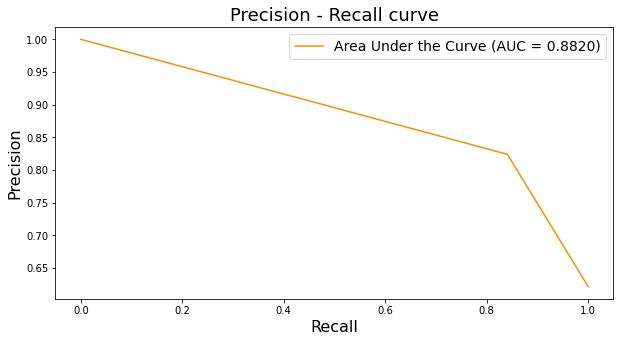

In [75]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
import numpy as np
import matplotlib.pyplot as plt
precision, recall, thresholds = precision_recall_curve(Y_ts, Y_ts_pred)
average_precision = average_precision_score(Y_ts, Y_ts_pred)
precision = np.fliplr([precision])[0]  #to avoid getting negative AUC)
recall = np.fliplr([recall])[0]  #to avoid getting negative AUC)
AUC_prec_rec = np.trapz(precision,recall)
print("\nArea under Precision-Recall curve: " +str(AUC_prec_rec))
prec_rec_curve = plt.figure()
plt.figure(figsize=(10,5))
plt.plot(recall,precision,'-',label='Area Under the Curve (AUC = %0.4f)' % AUC_prec_rec,color="darkorange")
plt.title('Precision - Recall curve',fontsize=18)
plt.xlabel("Recall",fontsize=16)
plt.ylabel("Precision",fontsize=16)
plt.legend(loc="best",prop={'size': 14})
plt.savefig("Precision_recall.png")
print("Average Precision Scores: " +str(average_precision))

In [77]:
precision

array([1.        , 0.82410815, 0.62191454])

In [78]:
recall

array([0.        , 0.84086765, 1.        ])

## Average Optimal Image Scale OIS-F score

In [ ]:
from sklearn.metrics import precision_score,recall_score
threshoulds=[0.3,0.4,0.5,0.6,0.7]
def recall_precison(y_true,y_pred):
  OIS_F=[]
  for i in range(0,len(y_pred)):
    OIS_F_thr=[]
    for thr in threshoulds:
      pr=np.where(((y_pred[i])[0])>thr,1.0,0.0)
      pr=reshape(pr,[224,224])
      pred_precision_score=precision_score(y_true[i],pr, average='weighted')
      pred_recall_score=recall_score(y_true[i],pr, average='weighted')
      OIS=2*pred_precision_score*pred_recall_score/(pred_precision_score+pred_recall_score)
      OIS_F_thr.append(OIS)
    OIS_F.append(OIS_F_thr)
  return OIS_F

In [ ]:
OIS_array=recall_precison(ground_truth_total,predictions)

In [ ]:
def OIS_F_score(OIS_array):
  best_OIS_F=[]
  index_max=[]
  for results in OIS_array:
    f_score=max(results)
    best_OIS_F.append(f_score)
    index = results.index(f_score)
    index_max.append(index)
  return best_OIS_F,index_max

In [ ]:
OIS_f1,indexes=OIS_F_score(OIS_array)

In [ ]:
print('Average Optimal Image Scale F score: ',np.nanmean(OIS_f1))

Average Optimal Image Scale F score:  0.8190864053717961


predicted class vs true class


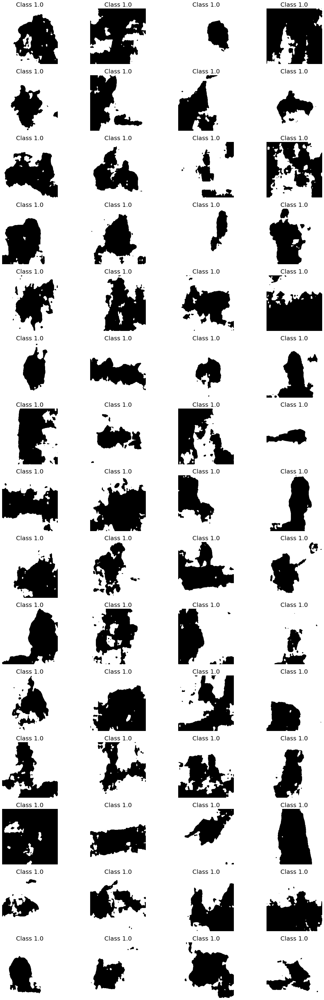

In [ ]:
columns = 4
rows = 15
print("predicted class vs true class")
fig = plt.figure(figsize=(20,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  img_pred_label = np.where(((predictions[i])[0])>0.5,1.0,0.0)
  #img_pred_label=(predictions[i])[0]
  plt.imshow(reshape(img_pred_label*255.0,[224,224]),cmap='gray')
  plt.title(f"Class {eval_class_label[i]}",fontsize=20)
  plt.axis("off")
plt.show()

predicted class vs true class


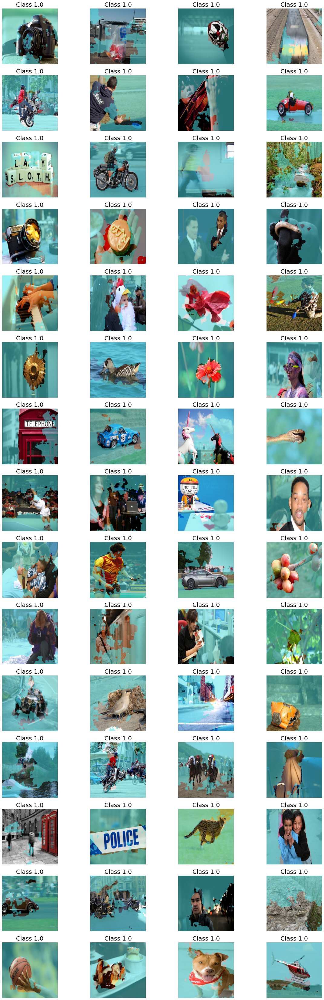

In [ ]:
fig = plt.figure(figsize=(20,60))
columns = 4
rows = 15
print("predicted class vs true class")
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  img_pred_label = np.where((((predictions[i])[0]))>0.5,1.0,0.0)
  #img_pred_label=(predictions[i])[0]
  mask=(img_pred_label*255.0).astype(np.uint8)
  blackFrame = np.zeros((224,224, 3), dtype = "uint8")
  whiteFrame = 255 * np.ones((224,224,3), np.uint8)
  mask = np.where(mask==255,whiteFrame,blackFrame)
  img= images[i]
  cyan = np.full_like(img,(80, 229, 235))
  blend = 0.5
  img_cyan = cv2.addWeighted(img, blend, cyan, 1-blend, 0)
  mask = np.where(mask>=165,img_cyan,img)
  plt.imshow(mask,cmap='binary')
  plt.title(f"Class {eval_class_label[i]}",fontsize=20)
  plt.axis("off")
plt.show()

predicted class vs true class


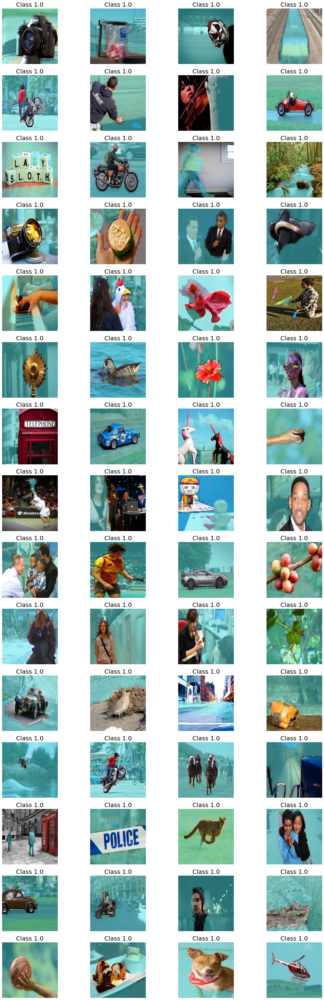

In [ ]:
fig = plt.figure(figsize=(20,60))
columns = 4
rows = 15
originalImsges=[]
print("predicted class vs true class")
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  #img_pred_label = np.where((((predictions[i])[0]))>0.5,1.0,0.0)
  #mask=(img_pred_label*255.0).astype(np.uint8)
  mask=reshape(eval_labels[i],[224,224,1]).astype(np.uint8)
  blackFrame = np.zeros((224,224, 3), dtype = "uint8")
  whiteFrame = 255 * np.ones((224,224,3), np.uint8)
  mask = np.where(mask==255,whiteFrame,blackFrame)
  img= images[i]
  cyan = np.full_like(img,(80, 229, 235))
  blend = 0.5
  img_cyan = cv2.addWeighted(img, blend, cyan, 1-blend, 0)
  mask = np.where(mask>=165,img_cyan,img)
  originalImsges.append(mask)
  plt.imshow(mask,cmap='binary')
  plt.title(f"Class {eval_class_label[i]}",fontsize=20)
  plt.axis("off")
plt.show()

In [ ]:
len(originalImsges)

60

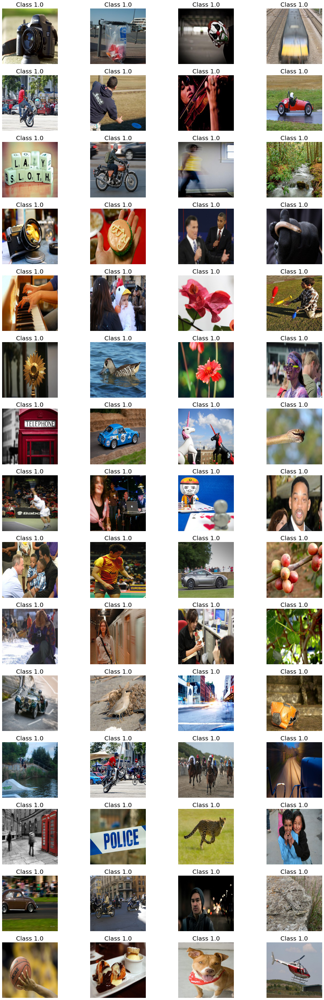

In [ ]:
fig = plt.figure(figsize=(20,60))
columns = 4
rows = 15
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  plt.imshow(images[i],cmap='gray')
  plt.title(f"Class {eval_class_label[i]}",fontsize=20)
  plt.axis("off")
plt.show()

predicted class vs true class


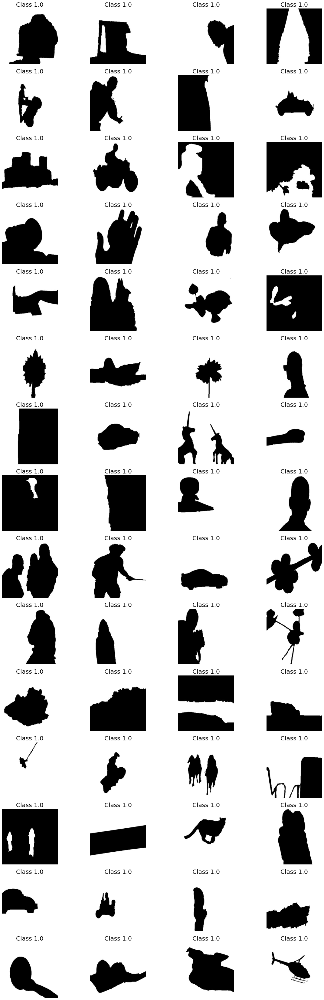

In [ ]:
columns = 4
rows = 15
print("predicted class vs true class")
fig = plt.figure(figsize=(20,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  plt.imshow(eval_labels[i],cmap='gray')
  plt.title(f"Class {eval_class_label[i]}",fontsize=20)
  plt.axis("off")
plt.show()